## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Compute the camera calibration with chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#read calibration images of chessboard 
images = glob.glob('camera_cal/calibration*')

#set two empty array to hold image points and object points
imgpoints = []
objpoints = []

#prepare object points
objp = np.zeros((6*9,3),np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

#convert to grayscale
for read in images:
    img = mpimg.imread(read)
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    #find chressboard corners 
    ret, corners = cv2.findChessboardCorners(gray_img,(9,6), None)
    #if found, add ojbpoints and imgpoints
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

In [2]:
def do_calibration(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None, None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

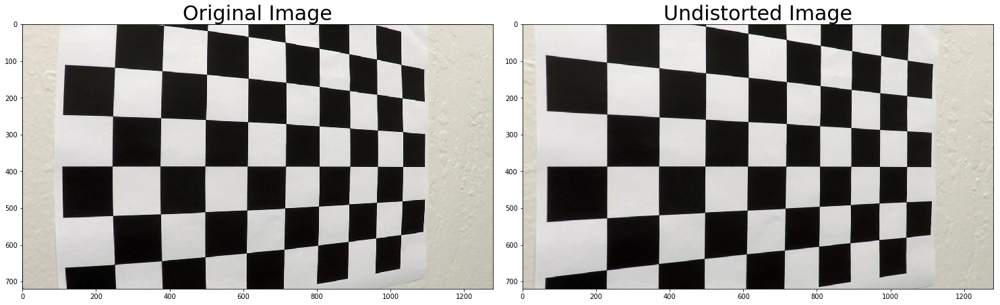

In [3]:
%matplotlib inline 
test_img = mpimg.imread('camera_cal/calibration5.jpg')
undistorted = do_calibration(test_img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
f.tight_layout()
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

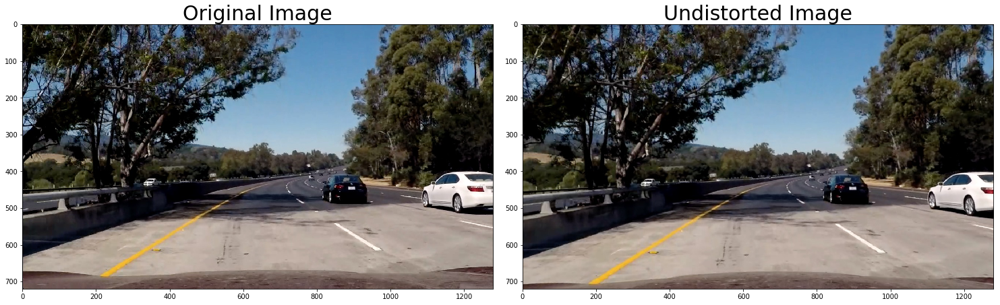

In [4]:
%matplotlib inline 
test_img1 = mpimg.imread('test_images/test5.jpg')
undistorted = do_calibration(test_img1, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
f.tight_layout()
ax1.imshow(test_img1)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Create a thresholded binary image

In [5]:
def sobelxy_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    #calculate directional gradient
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if(orient=='x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel)
    elif(orient=='y'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=sobel_kernel)
    #calculate the absolute value of derivative
    abs_sobel = np.absolute(sobel)
    #covert the absolute value image to 8-bit
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    #create a binary threshold to select pixels
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel>=thresh[0])&(scaled_sobel<=thresh[1])]=1
    return grad_binary

def mag_thresh(img, sobel_kernel=3, thresh=(0,255)):
    #calcultate magnitude of gradient
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=sobel_kernel)
    abs_sobelxy = np.sqrt(sobelx**2+sobely**2)
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel>=thresh[0])&(scaled_sobel<=thresh[1])]=1
    return mag_binary

def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # calculate gradient direction
    # Apply threshold
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    dir_grad = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(dir_grad)
    dir_binary[(dir_grad >= thresh[0]) & (dir_grad <= thresh[1])] =1
    return dir_binary

def hls_select(img, channel=0, thresh=(0,255)):
    #find threshold the channel of HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    cha = hls[:,:,channel] # 0:H, 1:l, 2:s
    hls_binary = np.zeros_like(cha)
    hls_binary[(cha>=thresh[0])&(cha<=thresh[1])]=1
    return hls_binary

def lab_select(img, channel=0, thresh=(0,255)):
    #find threshold the channel of LAB
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    cha = lab[:,:,channel] # 0:L, 1:A, 2:B
    lab_binary = np.zeros_like(cha)
    lab_binary[(cha>=thresh[0])&(cha<=thresh[1])]=1
    return lab_binary

In [6]:
gradx = sobelxy_thresh(undistorted, orient='x', sobel_kernel=5, thresh=(20, 180))
grady = sobelxy_thresh(undistorted, orient='y', sobel_kernel=5, thresh=(25, 220))
mag_binary = mag_thresh(undistorted, sobel_kernel=5, thresh=(40, 200))
dir_binary = dir_thresh(undistorted, sobel_kernel=3, thresh=(np.pi/6, np.pi/2.4))

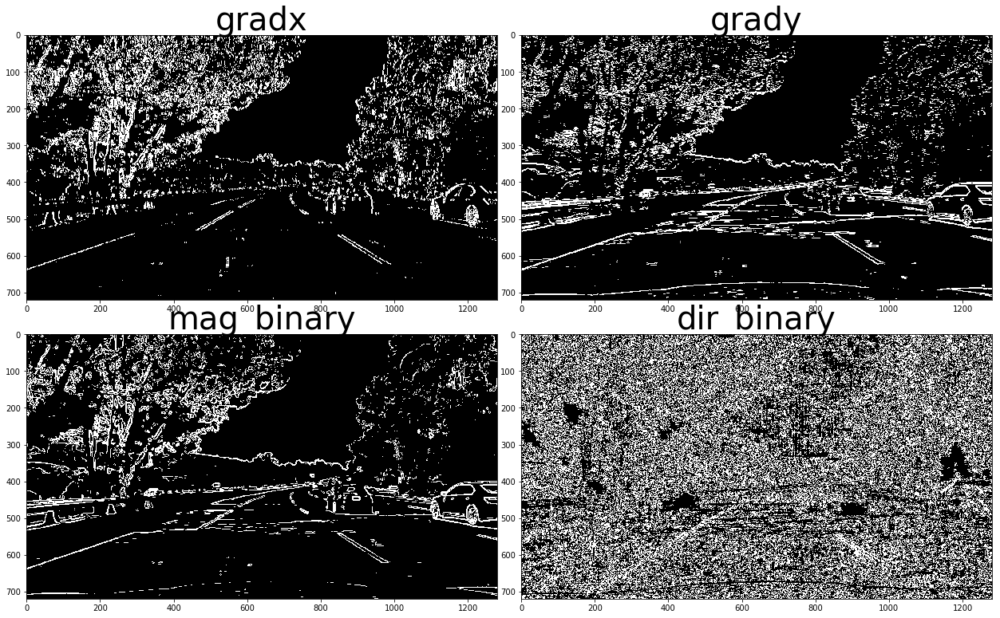

In [7]:
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(gradx, cmap='gray')
ax1.set_title('gradx', fontsize=40)
ax2.imshow(grady, cmap='gray')
ax2.set_title('grady', fontsize=40)
ax3.imshow(mag_binary, cmap='gray')
ax3.set_title('mag_binary', fontsize=40)
ax4.imshow(dir_binary, cmap='gray')
ax4.set_title('dir_binary', fontsize=40)

plt.subplots_adjust(left=0., right=0.7, top=1.1, bottom=0.)

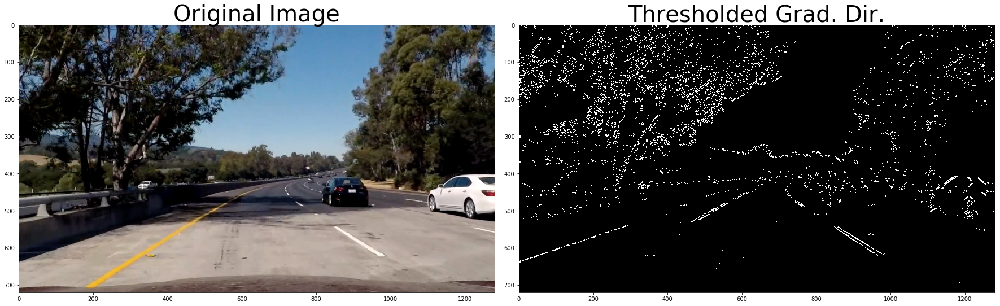

In [8]:
condition1 = np.zeros_like(dir_binary)

condition1[((gradx == 1) & (grady == 1)) & (dir_binary ==1) ] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted, cmap='gray')
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(condition1, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [9]:
l_binary = hls_select(undistorted, channel=1, thresh=(220, 255)) 
s_binary = hls_select(undistorted, channel=2, thresh=(125, 255))

b_binary = lab_select(undistorted, channel=2, thresh=(160, 255))

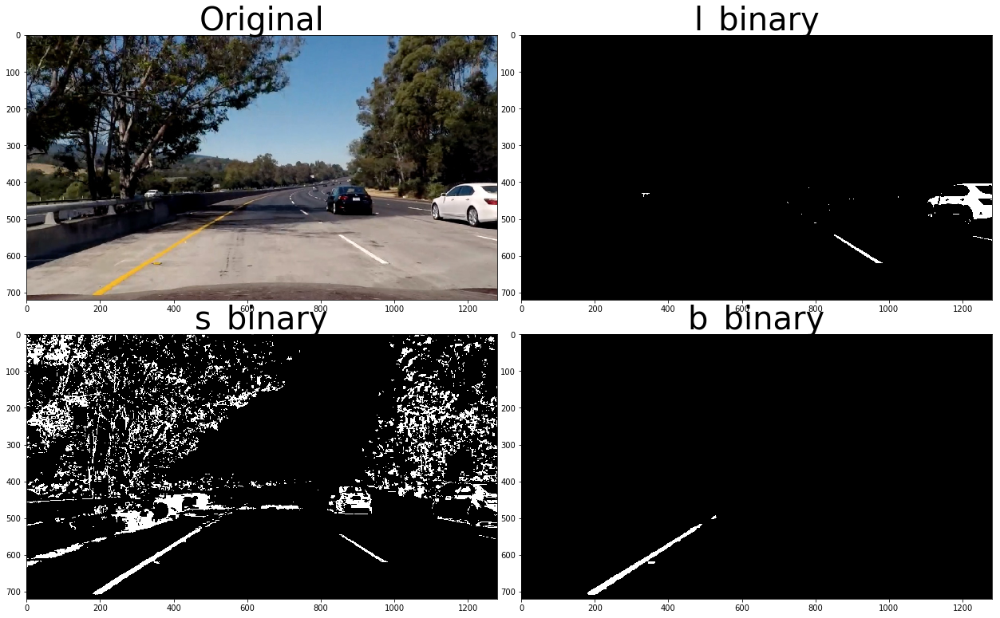

In [10]:
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted, cmap='gray')
ax1.set_title('Original', fontsize=40)
ax2.imshow(l_binary, cmap='gray')
ax2.set_title('l_binary', fontsize=40)
ax3.imshow(s_binary, cmap='gray')
ax3.set_title('s_binary', fontsize=40)
ax4.imshow(b_binary, cmap='gray')
ax4.set_title('b_binary', fontsize=40)

plt.subplots_adjust(left=0., right=0.7, top=1.1, bottom=0.)

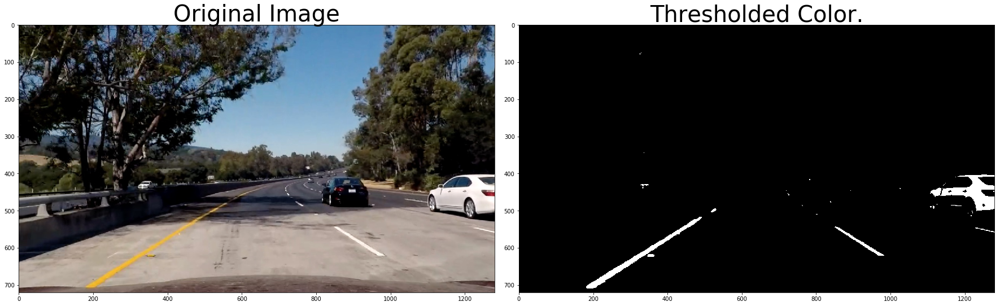

In [11]:
condition2 = np.zeros_like(b_binary)

condition2[((l_binary == 1) | (b_binary == 1))] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted, cmap='gray')
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(condition2, cmap='gray')
ax2.set_title('Thresholded Color.', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [12]:
def do_thresh_img(img):
    # apply gradxy threshold
    gradx = sobelxy_thresh(img, orient='x', sobel_kernel=5, thresh=(20, 200))
    grady = sobelxy_thresh(img, orient='y', sobel_kernel=5, thresh=(20, 200))
    mag_binary = mag_thresh(img, sobel_kernel=5, thresh=(50, 200))
    # apply direction threshold to detect edges closer to vertical 
    dir_binary = dir_thresh(img, sobel_kernel=3, thresh=(np.pi/6, np.pi/2.5))
    # s channle detect well both yellow and white
    s_binary = hls_select(img, channel=2, thresh=(100, 255))

    condtion1 = ((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))|(s_binary == 1)
    
    # apply color threshold 
    # to detect yellow channel well 
    R = img[:,:,0]
    G = img[:,:,1]
    rg_binary = (R > 150) & (G > 150)
    # l channel detect lane well under shadows 
    l_binary = hls_select(img, channel=1, thresh=(120, 255)) 
    condtion2 = rg_binary & l_binary
    
    # apply color threshold 
    l_binary = hls_select(img, channel=1, thresh=(220, 255)) 
    #s_binary = hls_select(undistorted, channel=2, thresh=(125, 255))
    b_binary = lab_select(img, channel=2, thresh=(190, 255))
    
    condition3 = ((l_binary == 1) | (b_binary == 1))
    
    combined = np.zeros_like(R)
    combined[((condtion1==1) & (condtion2==1))|((condition3 ==1)) ] = 1
    return combined 

In [13]:
def do_thresh_img2(img):
    # apply grad threshold
    gradx = sobelxy_thresh(img, orient='x', sobel_kernel=5, thresh=(20, 180))
    grady = sobelxy_thresh(img, orient='y', sobel_kernel=5, thresh=(25, 220))
    #mag_binary = mag_thresh(undistorted, sobel_kernel=5, thresh=(40, 200))
    dir_binary = dir_thresh(img, sobel_kernel=3, thresh=(np.pi/6, np.pi/2.4))

    # apply color threshold
    l_binary = hls_select(img, channel=1, thresh=(220, 255)) 
    #s_binary = hls_select(undistorted, channel=2, thresh=(125, 255))
    b_binary = lab_select(img, channel=2, thresh=(160, 255))
       
    condition1 = ((gradx == 1) & (grady == 1) & (dir_binary ==1))
    condition2 = ((l_binary == 1) | (b_binary == 1))
    
    combined = np.zeros_like(b_binary)
    combined[(condition1==1) | (condition2==1) ] = 1

    return combined 

In [14]:
def do_thresh_img1(img):
    # apply gradxy threshold
    gradx = sobelxy_thresh(img, orient='x', sobel_kernel=5, thresh=(20, 200))
    grady = sobelxy_thresh(img, orient='y', sobel_kernel=5, thresh=(20, 200))
    mag_binary = mag_thresh(img, sobel_kernel=5, thresh=(50, 200))
    # apply direction threshold to detect edges closer to vertical 
    dir_binary = dir_thresh(img, sobel_kernel=3, thresh=(np.pi/4.5, np.pi/2.5))
    # s channle detect well both yellow and white
    s_binary = hls_select(img, channel=2, thresh=(125, 255))

    condition1 = ((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))
    
    # apply color threshold 
    l_binary = hls_select(img, channel=1, thresh=(220, 255)) 
    #s_binary = hls_select(undistorted, channel=2, thresh=(125, 255))
    b_binary = lab_select(img, channel=2, thresh=(160, 255))
    
    condition2 = ((l_binary == 1) | (b_binary == 1))
    
    combined = np.zeros_like(b_binary)
    combined[(condition1==1) | (condition2==1) ] = 1
    return combined 
    

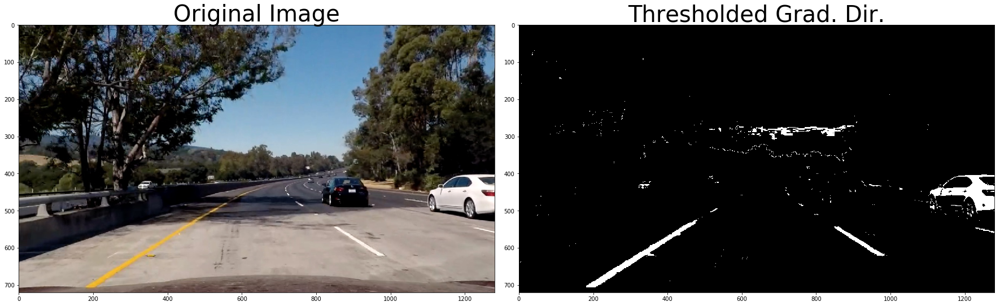

In [15]:
combined1 = do_thresh_img(undistorted)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted, cmap='gray')
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(combined1, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

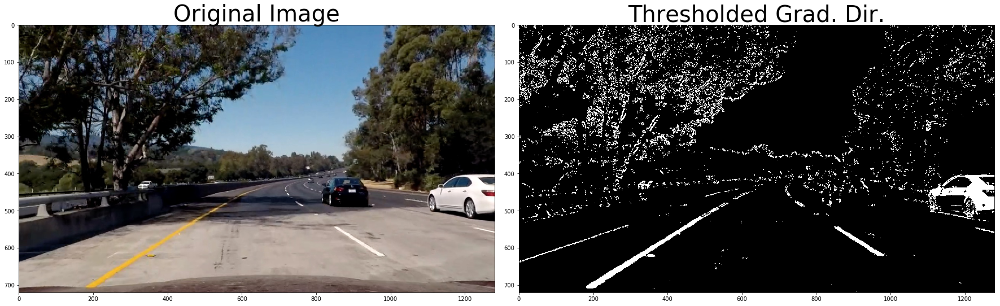

In [16]:
combined1 = do_thresh_img1(undistorted)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted, cmap='gray')
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(combined1, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [17]:
import matplotlib.image as mpimg
import os
os.listdir("test_images/")
input_dir = "test_images/"
all_files = os.listdir(input_dir)
images = []
for file_name in all_files:
    images.append(mpimg.imread(input_dir+file_name))

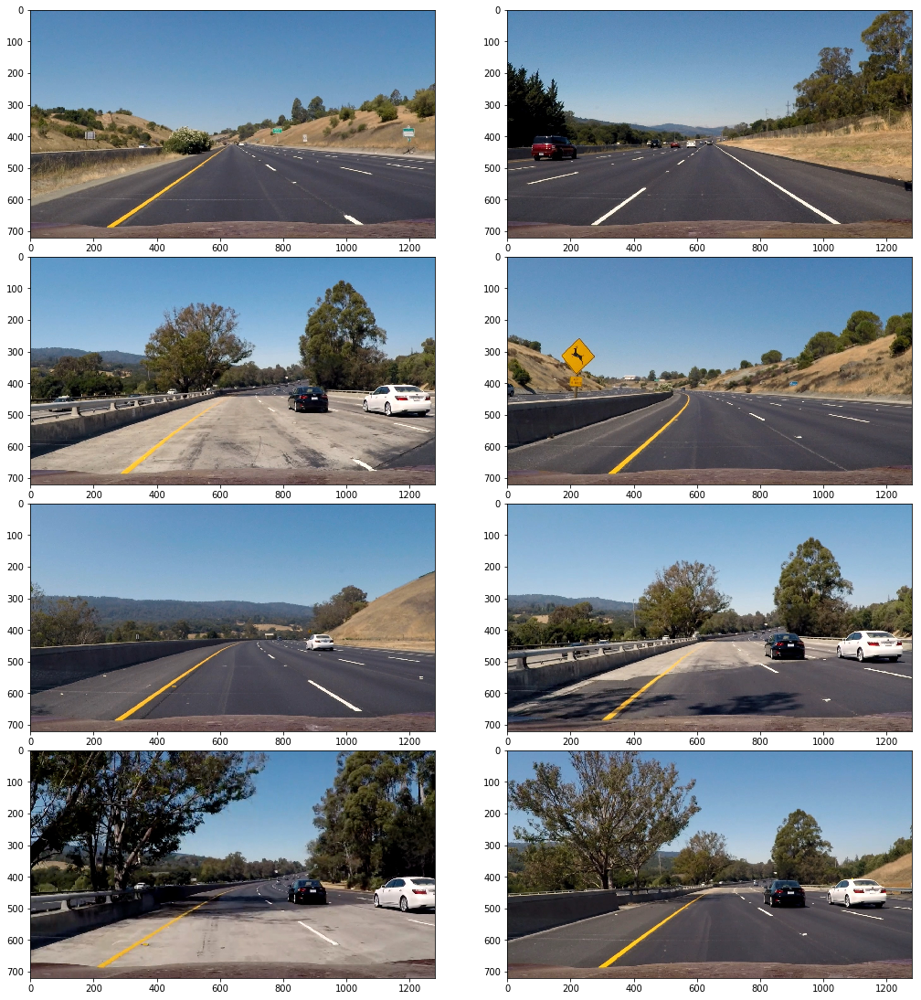

In [18]:
plt.figure(figsize=(15, 15))
for i, image in enumerate(images):
    if len(image.shape)==2:
        cmap='gray'
    else:
        cmap = None
    plt.subplot(4,2, i+1)
    plt.imshow(image,cmap=cmap)
plt.tight_layout(pad=0, h_pad=0, w_pad=0)
plt.show()

In [19]:
result = []
for image in images:
    undistorted = do_calibration(image, objpoints, imgpoints)
    combined_all = do_thresh_img(undistorted)
    result.append(combined_all)

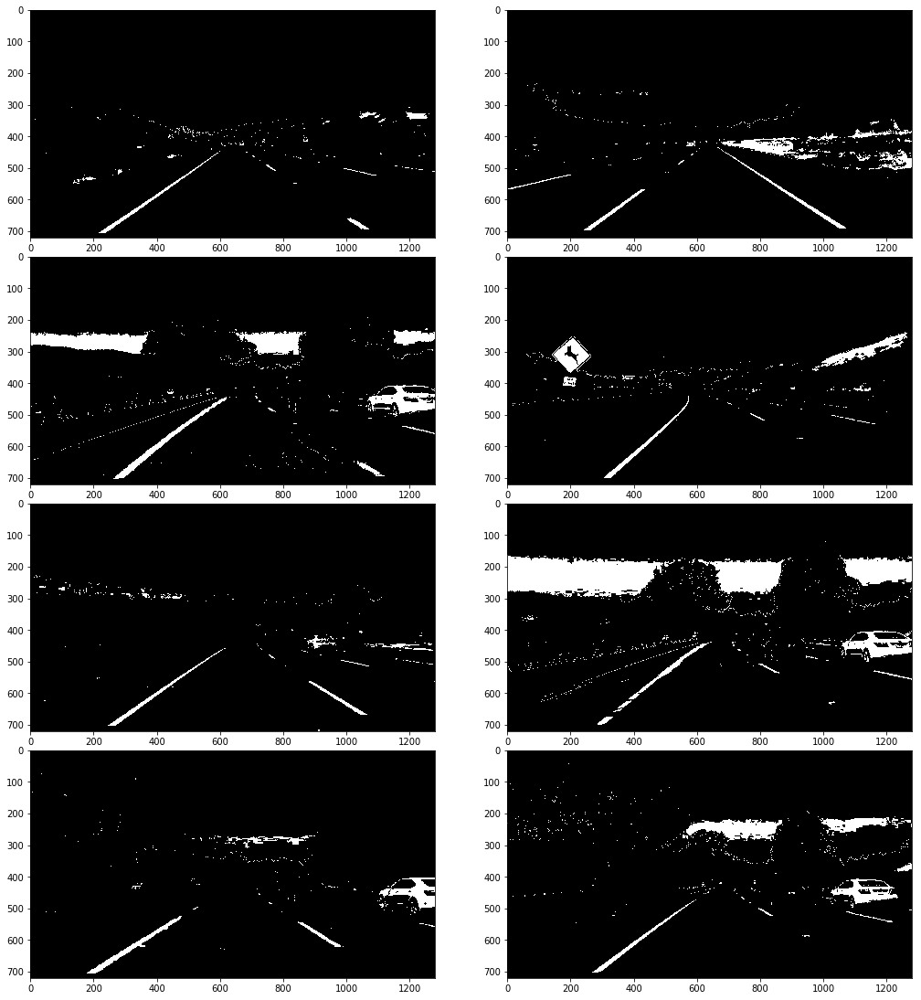

In [20]:
plt.figure(figsize=(15, 15))
for i, image in enumerate(result):
    if len(image.shape)==2:
        cmap='gray'
    else:
        cmap = None
    plt.subplot(4,2, i+1)
    plt.imshow(image,cmap=cmap)
plt.tight_layout(pad=0, h_pad=0, w_pad=0)
plt.show()

## Perspective transform

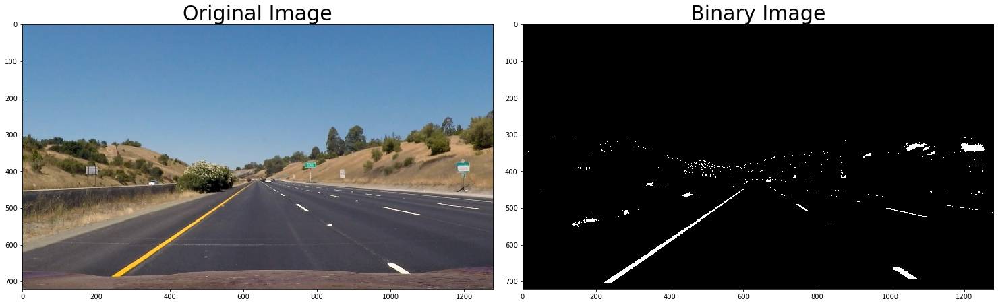

In [21]:
%matplotlib inline 
test_img2 = mpimg.imread('test_images/straight_lines1.jpg')
#test_img2 = mpimg.imread('test_images/test1.jpg')
undistorted2 = do_calibration(test_img2, objpoints, imgpoints)
combined2 = do_thresh_img(undistorted2)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
f.tight_layout()
ax1.imshow(test_img2, cmap='gray')
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined2, cmap='gray')
ax2.set_title('Binary Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [22]:
imshape = test_img2.shape
region = np.array([[(190,imshape[0]),(562, 470), (imshape[1]-560, 470), (imshape[1]-150,imshape[0])]], dtype=np.int32)

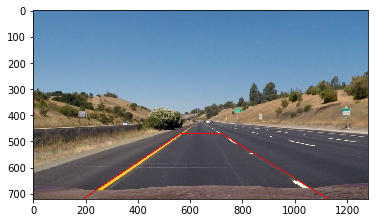

In [23]:
%matplotlib qt
#%matplotlib inline
copy = test_img2.copy()
cv2.polylines(copy,region,True,(255,0,0), thickness=2)
plt.imshow(copy)

In [24]:
src = np.float32(
    [[190, 720],
    [564, 472],
    [722, 472],
    [1130, 720]])

dst = np.float32(
    [[320,720],
    [320,0],
    [920,0],
    [920,720]])

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

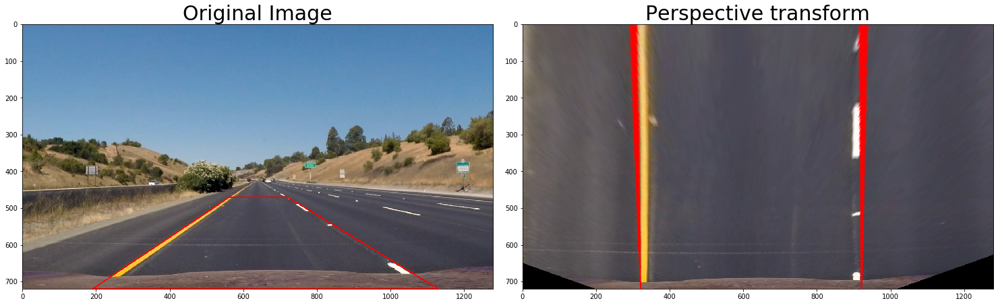

In [69]:
%matplotlib inline 
# Warp onto birds-eye-view
# Previous region-of-interest mask's function is absorbed by the warp

straight_line = cv2.warpPerspective(copy, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
f.tight_layout()
ax1.imshow(copy, cmap='gray')
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(straight_line, cmap='gray')
ax2.set_title('Perspective transform', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

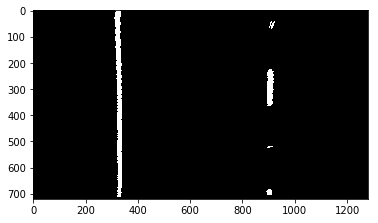

In [26]:
%matplotlib inline 
# Warp onto birds-eye-view
binary_warped = cv2.warpPerspective(combined2, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
plt.imshow(binary_warped, cmap="gray")

## Finding the lane pixels

In [45]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 50
    # Set minimum number of pixels found to recenter window
    minpix = 100
    
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current  - margin # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high) &
        (nonzeroy >= win_y_low) & (nonzeroy < win_y_high)).nonzero()[0]
        good_right_inds = ((nonzerox >= win_xright_low) & (nonzerox < win_xright_high) &
        (nonzeroy >= win_y_low) & (nonzeroy < win_y_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### If you found > minpix pixels, recenter next window
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

In [46]:
def fit_poly(left_fit, right_fit, out_img):
    img_shape = out_img.shape

    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    # Calc both polynomials using ploty, left_fit and right_fit 
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[np.int_(lefty), np.int_(leftx)] = [255, 0, 0]
    out_img[np.int_(righty), np.int_(rightx)] = [0, 0, 255]
    
    return left_fitx, right_fitx, ploty, out_img

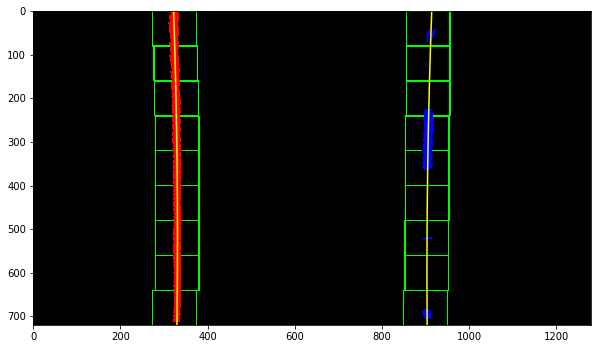

In [47]:
leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
left_fitx, right_fitx, ploty, out_img = fit_poly(left_fit, right_fit, out_img)
%matplotlib inline
plt.figure(figsize=(10, 10))
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.imshow(out_img)

In [48]:
def search_around_poly(leftx, lefty, rightx, righty, binary_warped):
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 50

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Set the area of search based on activated x-values 
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    return leftx, lefty, rightx, righty, out_img

In [49]:
def highlight_area(left_fitx, right_fitx, ploty, out_img):
    highlight_area_img = np.zeros_like(out_img)
    # Generate a polygon to highligt the lane
    left_line = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_line = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    highlight_area_pts = np.hstack((left_line, right_line))

    # Draw the lane onto the warped blank image
   
    cv2.fillPoly(highlight_area_img, np.int_([highlight_area_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, highlight_area_img, 0.3, 0)
    
    return result

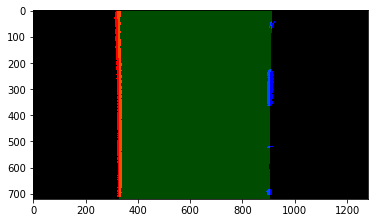

In [50]:
leftx, lefty, rightx, righty, out_img = search_around_poly(leftx, lefty, rightx, righty, binary_warped)
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
left_fitx, right_fitx, ploty, out_img = fit_poly(left_fit, right_fit, out_img)
result = highlight_area(left_fitx, right_fitx, ploty, out_img)
%matplotlib inline
plt.imshow(result)

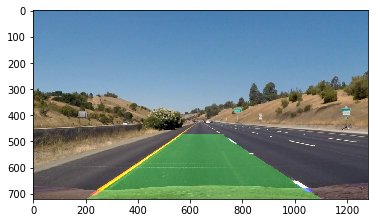

In [51]:
warped = cv2.warpPerspective(result, Minv, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
final_img = cv2.add(warped, test_img2)
plt.imshow(final_img)

# Compute the curvature  and center offset

In [52]:
def cal_curvature_real(left_fitx, right_fitx, ploty):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/600 # meters per pixel in x dimension
    y_eval = np.max(ploty)
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    left_curverad_real = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad_real = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    return left_curverad_real, right_curverad_real

In [53]:
left_curverad_real, right_curverad_real = cal_curvature_real(left_fitx, right_fitx, ploty)

print("Left lane curve radius: ", left_curverad_real, "meters")
print("Right lane curve radius: ", right_curverad_real, "meters")

Left lane curve radius:  4254.562006252105 meters
Right lane curve radius:  4555.84570381425 meters


In [54]:
def cal_center(imshape, left_fitx, right_fitx):
    xm_per_pix = 3.7/720 # meters per pixel in x dimension
    center = imshape[1]/2 - (left_fitx[710] + right_fitx[710]) / 2 
    center = center * xm_per_pix
    return center

def add_figures_to_image(img, curvature, vehicle_position):

    font = cv2.FONT_HERSHEY_SIMPLEX
    
    cv2.putText(img, 'Radius of Curvature = %d(m)' % curvature, (50, 50), font, 1, (255, 255, 255), 2)
    left_or_right = "right" if vehicle_position < 0 else "left"
    cv2.putText(img, 'Vehicle is %.2fm %s of center' % (np.abs(vehicle_position), left_or_right), (50, 100), font, 1,(255, 255, 255), 2)


In [55]:
curvature = (left_curverad_real + right_curverad_real) / 2
center = cal_center(imshape, left_fitx, right_fitx)

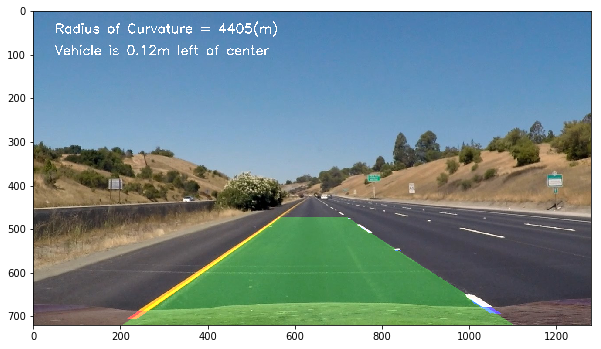

In [56]:
%matplotlib qt
add_figures_to_image(final_img, curvature=curvature, vehicle_position=center)
plt.figure(figsize=(10, 10))
plt.imshow(final_img)

# Building image pipeline

In [57]:
def average_coeff(list_left, list_right):
    sum_left = 0 
    sum_right = 0
    
    num_vaild_lines = len(list_left)
    
    for i in range(num_vaild_lines):
        sum_left += list_left[i]
        sum_right += list_right[i] 
        
    avg_left = sum_left / num_vaild_lines
    avg_right = sum_right / num_vaild_lines
    
    return  avg_left, avg_right


In [58]:
def image_pipeline(file, filepath=False):
    # global variables 
    global reset

    global leftx
    global lefty
    global rightx
    global righty
    # global variables to store the polynomial coefficients (13 frames)
    global  list_left_coff
    global  list_right_coff
    # global variables to store line x
    global  last_right_to_left

        
    
    if filepath == True:
        # Read in image
        img = mpimg.imread(file)
    else:
        img = file
        # Parameters
    imshape = img.shape
    
    src = np.float32(
        [[190, 720],
        [564, 472],
        [722, 472],
        [1130, 720]])

    dst = np.float32(
        [[320,720],
        [320,0],
        [920,0],
        [920,720]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Apply distortion correction to image
    undistorted = do_calibration(img, objpoints, imgpoints)
    
     # binary
    combined = do_thresh_img(undistorted)
    
    #perspective transfer
    binary_warped = cv2.warpPerspective(combined, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
    
    # finding lane pixels 
    if reset:
        leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
        last_right_to_left = np.mean(rightx) - np.mean(leftx)
        if len (leftx) == 0 or len(lefty) ==0 or len(rightx) == 0 or len(righty) ==0:
            reset = True
            vaild = False
        elif(min(leftx)<= 120) or (min(leftx)>= 520) or (min(rightx)<=720) or (min(rightx)>=1180):
            vaild = False
            reset = True
        else:
            reset = False
            vaild = True
    else:
        leftx, lefty, rightx, righty, out_img = search_around_poly(leftx, lefty, rightx, righty, binary_warped)
        curr_right_to_left = (np.mean(rightx) - np.mean(leftx))
        last_right_to_left = 0.9* last_right_to_left + 0.1 * curr_right_to_left
        
        if len (leftx) == 0 or len(lefty) ==0 or len(rightx) == 0 or len(righty) ==0:
            reset = True
            vaild = False
        
        elif ( curr_right_to_left < 0.8 * last_right_to_left) or (curr_right_to_left > 1.2 * last_right_to_left ):
            vaild = False
            reset = True
        else:
            reset = False
            vaild = True
       
  
    # store polynomial coefficients into a list      
    if vaild:         
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        if len(list_left_coff) < 13  and len(list_right_coff) < 13: 
            list_left_coff.append(left_fit)
            list_right_coff.append(right_fit)
        else: 
            list_left_coff.pop(0)
            list_right_coff.pop(0)     
            list_left_coff.append(left_fit)
            list_right_coff.append(right_fit)
    else:
        if len(list_left_coff) == 0  and len(list_right_coff) == 0:
            return img
        else:
            last_left = list_left_coff[-1]
            last_right = list_right_coff[-1]

            list_left_coff =[]
            list_right_coff =[]
            list_left_coff.append(last_left)
            list_right_coff.append(last_right)
            
   
    # cumpute averge polynomial coefficients with 13 frames
    avg_left_coff, avg_right_coff = average_coeff(list_left_coff, list_right_coff)

    # Visualization
    left_fitx, right_fitx, ploty, out_img = fit_poly(avg_left_coff, avg_right_coff, out_img)
    result = highlight_area(left_fitx, right_fitx, ploty, out_img)
    
    left_curverad_real, right_curverad_real = cal_curvature_real(left_fitx, right_fitx, ploty)
    
    #back transfer
    warped = cv2.warpPerspective(result, Minv, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
    final_img = cv2.add(warped, img)
    
    curvature = (left_curverad_real + right_curverad_real) / 2
    center = cal_center(imshape, left_fitx, right_fitx)

    add_figures_to_image(final_img, curvature=curvature, vehicle_position=center)

    return final_img

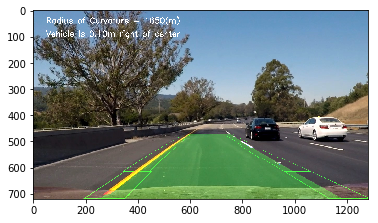

In [59]:
reset = True
list_left_coff =[]
list_right_coff = []
final_img = image_pipeline('test_images/test6.jpg', filepath=True)
plt.imshow(final_img)

## Test on video

In [60]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [63]:
regular = 'output/regular.mp4'
clip1 = VideoFileClip("project_video.mp4")
reset = True
list_left_coff =[]
list_right_coff = []
output_clip1 = clip1.fl_image(image_pipeline)
%time output_clip1.write_videofile(regular, audio=False)

[MoviePy] >>>> Building video output/regular.mp4
[MoviePy] Writing video output/regular.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [30:19<00:01,  1.68s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/regular.mp4 

Wall time: 30min 22s


In [64]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(regular))

In [61]:
challenge = 'output/challenge.mp4'
clip2 = VideoFileClip("challenge_video.mp4")
reset = True
list_left_coff =[]
list_right_coff = []
output_clip2 = clip2.fl_image(image_pipeline) 
%time output_clip2.write_videofile(challenge, audio=False)

[MoviePy] >>>> Building video output/challenge.mp4
[MoviePy] Writing video output/challenge.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [09:52<00:00,  1.44s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/challenge.mp4 

Wall time: 9min 54s


In [62]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge))

In [65]:
harder = 'output/harder.mp4'
clip3 = VideoFileClip("harder_challenge_video.mp4")
reset = True
list_left_coff =[]
list_right_coff = []
output_clip3 = clip3.fl_image(image_pipeline) 
%time output_clip3.write_videofile(harder, audio=False)

[MoviePy] >>>> Building video output/harder.mp4
[MoviePy] Writing video output/harder.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [37:01<00:01,  1.82s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/harder.mp4 

Wall time: 37min 4s


In [66]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harder))